Original Audio:


c:\Users\mabd0\anaconda3\Lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


Equalized audio saved as equalized_speech.wav
Equalized Audio:


C:\Users\mabd0\AppData\Local\Temp\ipykernel_9416\314933922.py:77: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(times, freqs, 10 * np.log10(Sxx), shading='gouraud')


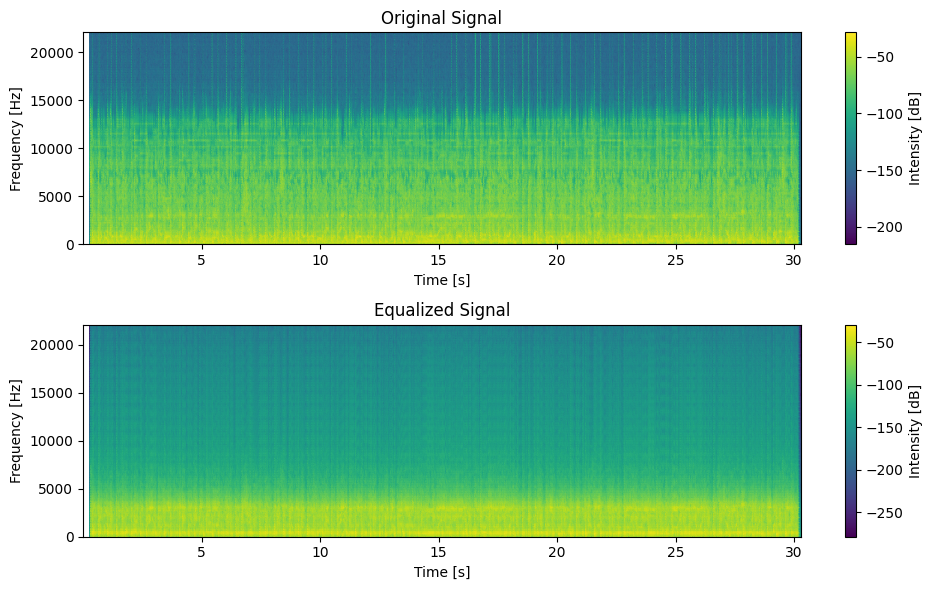

In [1]:
# -*- coding: utf-8 -*-
"""Speech Processing Script for Local Environment"""

import numpy as np
import scipy.signal as sp_signal
import matplotlib.pyplot as plt
import soundfile as sf
from pydub import AudioSegment
from IPython.display import Audio

# Define paths to the input and output files
input_file = 'racing.wav'  # Replace with your local audio file name
output_file = 'equalized_speech.wav'

# Convert .m4a to .wav if needed using pydub
if input_file.endswith('.m4a'):
    audio = AudioSegment.from_file(input_file, format='m4a')
    audio.export('converted_audio.wav', format='wav')
    input_file = 'converted_audio.wav'
    print(f'Converted .m4a to .wav: {input_file}')

# Load the converted .wav audio data
original_signal, sample_rate = sf.read(input_file)

# Convert to mono if the audio is stereo
if len(original_signal.shape) > 1:
    original_signal = np.mean(original_signal, axis=1)

# Listen to the original audio (if using Jupyter Notebook)
print("Original Audio:")
display(Audio(input_file, rate=sample_rate))

# Define frequency bands for the equalizer (e.g., low, mid, and high)
freq_bands = {
    'low': (300, 600),
    'mid': (1000, 2000),
    'high': (2000, 3400)
}

# Set initial gain levels (in dB) for each band
gain = {
    'low': 5,   # boost by 5 dB
    'mid': -3,  # cut by 3 dB
    'high': 4   # boost by 4 dB
}

# Convert dB gains to linear scale
gain_linear = {band: 10**(g / 20) for band, g in gain.items()}

# Filter design helper function
def bandpass_filter(data, band, sample_rate, gain):
    low, high = band
    sos = sp_signal.butter(4, [low / (sample_rate / 2), high / (sample_rate / 2)], btype='band', output='sos')
    filtered = sp_signal.sosfilt(sos, data)
    return filtered * gain

# Apply filters for each frequency band
filtered_signal = np.zeros_like(original_signal)
for band, (low_freq, high_freq) in freq_bands.items():
    filtered_band = bandpass_filter(original_signal, (low_freq, high_freq), sample_rate, gain_linear[band])
    filtered_signal += filtered_band

# Normalize the equalized signal to avoid low volume
filtered_signal = filtered_signal / np.max(np.abs(filtered_signal))

# Save the equalized audio locally
sf.write(output_file, filtered_signal, sample_rate)
print(f'Equalized audio saved as {output_file}')

# Listen to the equalized audio (if using Jupyter Notebook)
print("Equalized Audio:")
display(Audio(output_file, rate=sample_rate))

# Plot frequency response of original and equalized signal
def plot_frequency_response(signal_data, sample_rate, title):
    freqs, times, Sxx = sp_signal.spectrogram(signal_data, sample_rate)
    plt.pcolormesh(times, freqs, 10 * np.log10(Sxx), shading='gouraud')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [s]')
    plt.title(title)
    plt.colorbar(label='Intensity [dB]')

plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plot_frequency_response(original_signal, sample_rate, 'Original Signal')
plt.subplot(2, 1, 2)
plot_frequency_response(filtered_signal, sample_rate, 'Equalized Signal')
plt.tight_layout()
plt.show()
